In [26]:
from Bio import SeqIO
# Input and output file paths
input_file = "../../../../../Desktop/Virus_fasta/Solemoviridae.fasta"  # Replace with your input file path
output_file = "../../../../../Desktop/Virus_fasta/Solemoviridae1.fasta"  # Replace with your output file path
# Read the FASTA file
sequences = SeqIO.parse(input_file, "fasta")
# Prepare a list to store modified sequences
modified_sequences = []
# Iterate over the sequences and modify the headers
for seq in sequences:
    # Modify the header by removing the first two '|' characters
    modified_header = seq.id
    modified_header = modified_header.split('|', 2)[-1]  # Remove the first two '|' characters
    seq.id = modified_header
    seq.description = ""  # Remove the description if you want to keep it clean
    modified_sequences.append(seq)
# Write the modified sequences to a new FASTA file
SeqIO.write(modified_sequences, output_file, "fasta")
print(f"FASTA file processed and saved to: {output_file}")

FASTA file processed and saved to: ../../../../../Desktop/Virus_fasta/Solemoviridae1.fasta


In [28]:
import csv
from Bio import SeqIO

# Build mapping from contig_name to a list of (sci_name, segment) pairs.
mapping = {}
with open('../../../../../Desktop/Virus_fasta/Annotate_SENZOR_Sequence.csv', newline='') as csvfile:
    reader = csv.DictReader(csvfile, delimiter=',')
    for row in reader:
        contig = row['contig_name']
        info = (row['sci_name'], row['segment'])
        mapping.setdefault(contig, []).append(info)

def unique_ordered(items):
    seen = set()
    unique = []
    for item in items:
        if item not in seen:
            unique.append(item)
            seen.add(item)
    return unique

# Process the FASTA file and write to a new output file.
with open('../../../../../Desktop/Virus_fasta/Solemoviridae1.fasta') as infile, open('../../../../../Desktop/Virus_fasta/Solemoviridae3.fasta', 'w') as outfile:
    for record in SeqIO.parse(infile, 'fasta'):
        # Remove trailing '|' and everything after it if present.
        if '|' in record.id:
            base_id = record.id.rsplit('|', 1)[0]
        else:
            base_id = record.id
        
        # Replace tilde (~) with underscore (_) to match the CSV naming convention.
        cleaned_id = base_id.replace("~", "_")
        
        # If this cleaned_id exists in the CSV mapping, append sci_name and segment info only once.
        if cleaned_id in mapping:
            unique_info = unique_ordered(mapping[cleaned_id])
            sci, seg = unique_info[0]
            appended_info = f"{sci}_{seg}"
            cleaned_id = f"{cleaned_id}_{appended_info}"
        
        # Update record with the new id.
        record.id = cleaned_id
        # Clear description to prevent duplication in the FASTA header.
        record.description = ""
        SeqIO.write(record, outfile, 'fasta')

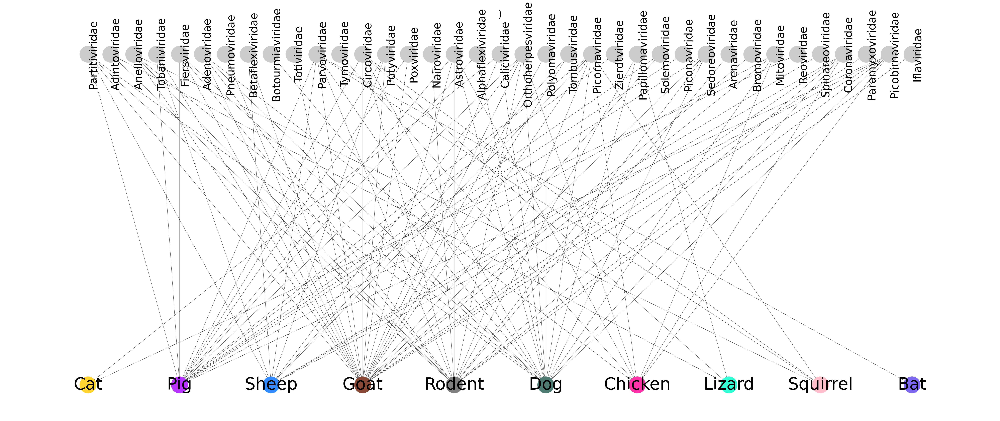

In [116]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1. READ & PREPARE THE DATA
# -------------------------------------------------------------------
df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/Name_DNA_RNA_virus1.csv")
df['presence'] = df['read_count'].apply(lambda x: 1 if x > 0 else 0)

hosts = df['ska_species'].unique().tolist()
viruses = df['family'].unique().tolist()

# -------------------------------------------------------------------
# 2. BUILD A BIPARTITE GRAPH
# -------------------------------------------------------------------
G = nx.Graph()
for h in hosts:
    G.add_node(h, bipartite='host')
for v in viruses:
    G.add_node(v, bipartite='virus')

for _, row in df.iterrows():
    if row['presence'] == 1:
        G.add_edge(row['ska_species'], row['family'])

# -------------------------------------------------------------------
# 3. COLORS
# -------------------------------------------------------------------
host_colors = {
    'Chicken':   '#FF33A6',
    'Bat':       '#7B68EE',
    'Dog':       '#4D7D73',
    'Goat':      '#884936',
    'Egret':     '#A52A2A',
    'Cat':       '#FFD433',
    'Sheep':     '#338CFF',
    'Rodent':    'grey',
    'Lizard':    '#33FFD4',
    'Squirrel':  '#FFC0CB',
    'Pig':       '#B833FF'
}

node_color_map = {}
for node in G.nodes():
    if node in host_colors:
        node_color_map[node] = host_colors[node]
    else:
        node_color_map[node] = "#CCCCCC"  # viruses

node_colors = [node_color_map[n] for n in G.nodes()]

# Separate host vs. virus nodes for labeling
host_nodes = [n for n, d in G.nodes(data=True) if d['bipartite'] == 'host']
virus_nodes = [n for n, d in G.nodes(data=True) if d['bipartite'] == 'virus']

host_labels = {n: n for n in host_nodes}
# virus_labels = {n: n for n in virus_nodes}  # We will manually place these

# -------------------------------------------------------------------
# 4. LAYOUT
# -------------------------------------------------------------------
pos = nx.bipartite_layout(
    G,
    host_nodes,            # one partition
    align='horizontal',    # left/right
    scale=4,
    aspect_ratio=1.5
)

# -------------------------------------------------------------------
# 5. DRAW THE NETWORK
# -------------------------------------------------------------------
plt.figure(figsize=(70, 30))

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.8)

# Draw all nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=7000)

# Draw host labels (horizontal)
nx.draw_networkx_labels(G, pos, labels=host_labels, font_size=85)

# Manually place virus labels (vertical)
for v in virus_nodes:
    x, y = pos[v]
    plt.text(
        x, y, v,
        fontsize=55,
        rotation=90,                # <-- Vertical text
        horizontalalignment='left', # or 'right' or 'center'
        verticalalignment='center'
    )

plt.axis("off")
plt.title(")", fontsize=50)
plt.tight_layout()
plt.show()


In [160]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1. READ & PREPARE THE DATA
# -------------------------------------------------------------------
df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/Name_DNA_RNA_virus1.csv")
df['presence'] = df['read_count'].apply(lambda x: 1 if x > 0 else 0)

hosts = df['ska_species'].unique().tolist()
viruses = df['family'].unique().tolist()

G = nx.Graph()

for h in hosts:
    G.add_node(h, bipartite='host')

for v in viruses:
    G.add_node(v, bipartite='virus')

for _, row in df.iterrows():
    if row['presence'] == 1:
        G.add_edge(row['ska_species'], row['family'])

# -------------------------------------------------------------------
# 2. SPECIFY ONLY VIRUS COLORS
# -------------------------------------------------------------------
# This dictionary covers just the few families you want to color
color_df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/fig3_color_palette.txt", delim_whitespace=True, header=0)
virus_color_map = dict(zip(color_df["key"], color_df["color"]))

# We'll default everything to light gray unless it's a recognized virus
node_color_map = {}
for node in G.nodes():
    # If this node is one of the known virus families, color it from the dict
    if node in virus_color_map:
        node_color_map[node] = virus_color_map[node]
    else:
        # Otherwise (including hosts & any other virus families), light gray
        node_color_map[node] = "#CCCCCC"

# -------------------------------------------------------------------
# 3. LAYOUT (CONNECTED COMPONENTS EXAMPLE)
# -------------------------------------------------------------------
components = list(nx.connected_components(G))

pos = {}
x_offset = 0.0
y_offset = 0.0
spacing = 15.0

for i, comp_nodes in enumerate(components):
    subG = G.subgraph(comp_nodes)
    # Use spring_layout or bipartite_layout here as you prefer
    sub_pos = nx.spring_layout(subG, k=0.8, seed=i)
    
    # Shift positions so components don't overlap
    for n in sub_pos:
        sub_pos[n] = (sub_pos[n][0] + x_offset, sub_pos[n][1] + y_offset)
    
    pos.update(sub_pos)
    x_offset += spacing

# -------------------------------------------------------------------
# 4. DRAW THE NETWORK
# -------------------------------------------------------------------
node_colors = [node_color_map[n] for n in G.nodes()]

plt.figure(figsize=(95, 60))

nx.draw_networkx_edges(G, pos, alpha=0.7)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=30000)
nx.draw_networkx_labels(G, pos, font_size=95)

plt.axis("off")
plt.title("", fontsize=35)
plt.tight_layout()
plt.savefig("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/vertical_family_bar_plot.png", dpi=300)
plt.show()

In [193]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

def main():
    # -------------------------------------------------------------------
    # 1. READ YOUR DATA
    # -------------------------------------------------------------------
    df = pd.read_csv(
        "/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/"
        "Combined_SENZOR_results/1final_today_NEW_Virus_model_unique_sci_name_aggregated.csv"
    )
    # Columns in df include:
    #   family, sci_name, hosts, location, sample_type, host_order, host_habitat,
    #   virus_host_count, infected_host_sample_size, read_count, read_prop, RPM, actual_host_sample_size
    #
    # We will put "sample_type" on the X‐axis, and "family" on the Y‐axis.

    # -------------------------------------------------------------------
    # 2. CREATE A "RICHNESS" COLUMN: #unique sci_name per family+sample_type
    # -------------------------------------------------------------------
    # Group by family & sample_type to find how many unique sci_name in each cell
    richness_df = (
        df.groupby(["family", "sample_type"])["sci_name"]
          .nunique()
          .reset_index(name="richness")
    )
    # Merge back so each row knows its "richness"
    df = df.merge(richness_df, on=["family", "sample_type"], how="left")

    # -------------------------------------------------------------------
    # 3. CALCULATE log10(RPM) FOR COLOR
    # -------------------------------------------------------------------
    df["logRPM"] = np.log10(df["RPM"] + 1e-6)  # tiny offset to avoid log(0)

    # -------------------------------------------------------------------
    # 4. DETERMINE X & Y AXES
    # -------------------------------------------------------------------
    # X-axis: sample_type
    # Y-axis: family
    sample_types = sorted(df["sample_type"].unique())
    families = sorted(df["family"].unique())

    # Map each sample_type -> integer index (x‐coordinate)
    sample_to_x = {s: i for i, s in enumerate(sample_types)}
    # Map each family -> integer index (y‐coordinate)
    family_to_y = {f: i for i, f in enumerate(families)}

    # -------------------------------------------------------------------
    # 5. GATHER DATA FOR THE SCATTER (BUBBLE) PLOT
    # -------------------------------------------------------------------
    xcoords, ycoords = [], []
    colors, sizes = [], []

    # Choose a colormap
    cmap = plt.cm.coolwarm  # or "RdBu_r", "viridis", etc.

    # For normalizing logRPM to [0..1]
    min_logrpm = df["logRPM"].min()
    max_logrpm = df["logRPM"].max()
    def normalize_logrpm(val):
        return (val - min_logrpm) / (max_logrpm - min_logrpm + 1e-9)

    # Scale factor for bubble size
    size_factor = 50

    for _, row in df.iterrows():
        x = sample_to_x[row["hosts"]]
        y = family_to_y[row["family"]]

        # Convert logRPM to a [0..1] fraction for colormap
        frac = normalize_logrpm(row["logRPM"])
        color = cmap(frac)

        # Bubble size from "richness"
        bubble_size = row["richness"] * size_factor

        xcoords.append(x)
        ycoords.append(y)
        colors.append(color)
        sizes.append(bubble_size)

    # -------------------------------------------------------------------
    # 6. MAKE THE FIGURE & SCATTER (BUBBLE) PLOT
    # -------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(12, 8))

    scatter = ax.scatter(
        xcoords, 
        ycoords, 
        c=colors, 
        s=sizes, 
        alpha=0.7, 
        edgecolors="none"
    )

    # Configure axes
    ax.set_xticks(range(len(sample_types)))
    ax.set_xticklabels(sample_types, rotation=90)
    ax.set_yticks(range(len(families)))
    ax.set_yticklabels(families)

    ax.set_xlabel("Sample Type", fontsize=12)
    ax.set_ylabel("Virus Family", fontsize=12)
    ax.set_title("Bubble Plot: Family vs. Sample Type\nColor=log10(RPM), Size=Richness", fontsize=14)

    # -------------------------------------------------------------------
    # 7. COLORBAR FOR logRPM
    # -------------------------------------------------------------------
    norm = mpl.colors.Normalize(vmin=min_logrpm, vmax=max_logrpm)
    cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cbar.set_label("log10(RPM)")

    # -------------------------------------------------------------------
    # 8. LEGEND FOR BUBBLE SIZE (RICHNESS)
    # -------------------------------------------------------------------
    for example_richness in [1, 5, 10, 20]:
        plt.scatter([], [], s=example_richness * size_factor, c="gray", alpha=0.7,
                    label=f"Richness = {example_richness}")
    ax.legend(scatterpoints=1, frameon=True, labelspacing=1, loc="upper right")

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

KeyError: 'Bat'

Presence column values:
1    1672
Name: presence, dtype: int64
Aggregated data:
                                     name              family ska_species  \
0       Abak Alcelaphine gammaherpesvirus  Orthoherpesviridae         Pig   
1  Abak Ambrosia artemisiifolia mitovirus         Mitoviridae         Pig   
2               Abak Botourmiaviridae sp.    Botourmiaviridae         Dog   
3           Abak Bovine gammaherpesvirus   Orthoherpesviridae         Pig   
4                   Abak Bovine nidovirus       Tobaniviridae         Pig   

   presence  
0         1  
1         1  
2         1  
3         1  
4         1  
Pivot table:
ska_species        family                        name  Bat  Cat  Chicken  Dog  \
0            Adenoviridae      Abak Murine adenovirus    0    0        0    0   
1            Adenoviridae  Abak Tree shrew adenovirus    0    0        1    0   
2            Adenoviridae           Bovine adenovirus    0    0        0    0   
3            Adenoviridae           

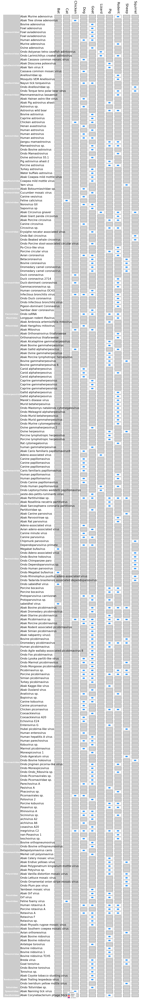

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# -------------------------------------------------------------------
# 1. READ & PREPARE THE DATA
# -------------------------------------------------------------------
df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/Name_DNA_RNA_virus1.csv")

# Mark presence if read_count > 0
df['presence'] = df['read_count'].apply(lambda x: 1 if x < 2 else 0)

def unify_name(n):
    # unify certain virus names if desired
    if "Human adenovirus" in n:
        return "Human adenovirus"
    if "Betacoronavirus" in n:
        return "Betacoronavirus"
    if "Dromedary Camel coronavirus" in n:
        return "Dromedary Camel coronavirus"
    if "Porcine bosavirus" in n:
        return "Porcine bosavirus"
    return n

df['name'] = df['name'].apply(unify_name)

# Clean up location strings (remove extra spaces)
df['collected_by'] = df['collected_by'].str.strip()

# Build a dictionary that tracks which locations a virus-host pair came from
location_dict = {}  # (family, name, ska_species) -> set of locations
for _, row in df.iterrows():
    if row['presence'] == 1:
        key = (row['family'], unify_name(row['name']), row['ska_species'])
        location_dict.setdefault(key, set()).add(row['collected_by'])

# Recalculate presence column
df['presence'] = df['read_count'].apply(lambda x: 1 if x > 0 else 0)

# Debugging: Print presence column values
print("Presence column values:")
print(df['presence'].value_counts())

# Aggregate presence by (name, family, ska_species)
df_agg = df.groupby(['name', 'family', 'ska_species'], as_index=False)['presence'].max()

# Debugging: Print aggregated data
print("Aggregated data:")
print(df_agg.head())

# Pivot: rows=(family,name), cols=hosts
df_pivot = df_agg.pivot_table(
    index=['family', 'name'],
    columns='ska_species',
    values='presence',
    fill_value=0
).reset_index()

# Debugging: Print pivot table
print("Pivot table:")
print(df_pivot.head())

# Optionally remove single-host viruses
host_cols = [c for c in df_pivot.columns if c not in ('family', 'name')]
df_pivot['host_count'] = df_pivot[host_cols].sum(axis=1)
df_pivot = df_pivot[df_pivot['host_count'] > 0]  # Changed from > 1 to > 0
df_pivot.drop(columns='host_count', inplace=True)

# Debugging: Print pivot table after filtering
print("Pivot table after filtering:")
print(df_pivot.head())

# Remove empty host columns
hosts_to_keep = [h for h in host_cols if df_pivot[h].sum() > 0]
df_pivot = df_pivot[['family', 'name'] + hosts_to_keep]

# Debugging: Print final pivot table
print("Final pivot table:")
print(df_pivot.head())

# -------------------------------------------------------------------
# 2. FAMILY->COLOR MAP (Optional)
# -------------------------------------------------------------------
try:
    color_df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/fig3_color_palette.txt", sep="\t", header=True, names=["key","color"])
    family_color_map = dict(zip(color_df["key"], color_df["color"]))
    default_color = "#CCCCCC"
except:
    family_color_map = {}
default_color = "#CCCCCC"


# -------------------------------------------------------------------
# 3. SETUP FIGURE
# -------------------------------------------------------------------
num_rows = len(df_pivot)
num_hosts = len(hosts_to_keep)
fig_width = 18
fig_height = max(4, 0.5 * num_rows)

fig, ax = plt.subplots(figsize=(fig_width, fig_height))
ax.set_xlim([0, num_hosts + 6])
ax.set_ylim([0, num_rows + 1])
ax.invert_yaxis()
ax.axis('off')

# -------------------------------------------------------------------
# 4. DRAW A VERTICAL COLORED BAR PER FAMILY
# -------------------------------------------------------------------
family_groups = df_pivot.groupby('family').groups
bar_left = 0.0
bar_width = 2.0

for fam, indices in family_groups.items():
    row_min = min(indices)
    row_max = max(indices)
    top = row_min + 0.5
    bottom = row_max + 1.5
    height = bottom - top
    
    color_for_fam = family_color_map.get(fam, default_color)
    rect = patches.Rectangle(
        (bar_left, top),
        bar_width,
        height,
        facecolor=color_for_fam,
        edgecolor='none'
    )
    ax.add_patch(rect)
    
    ax.text(
        bar_left + bar_width/2,
        (top + bottom)/2,
        fam,
        ha='center', va='center',
        fontsize=18, fontweight='bold',
        color='white'
    )

# -------------------------------------------------------------------
# 5. DRAW VIRUS NAMES & BOXES WITH LOCATION-COLORED DOTS
# -------------------------------------------------------------------
virus_name_x = 2
start_box_x = 6

for i, row in df_pivot.iterrows():
    y_center = i + 1
    fam = row['family']
    virus_name = row['name']
    
    ax.text(
        virus_name_x, y_center,
        virus_name,
        ha='left', va='center',
        fontsize=24
    )
    
    for j, host in enumerate(hosts_to_keep):
        presence = row[host]
        x_left = start_box_x + j
        box_size = 0.8
        y_bottom = y_center - box_size/2
        
        fill_color = 'white' if presence == 1 else 'lightgrey'
        rect = patches.Rectangle(
            (x_left, y_bottom),
            box_size, box_size,
            facecolor=fill_color,
            edgecolor='black',
            linewidth=1
        )
        ax.add_patch(rect)
        
        if presence == 1:
            # Look up location(s) for this (fam, virus_name, host)
            key = (fam, virus_name, host)
            locs = location_dict.get(key, set())
            
            # Decide dot color
            if "Ebonyi" in locs and "Ondo" in locs:
                circle_color = "purple"
            elif "Ebonyi" in locs:
                circle_color = "steelblue"
            elif "Ondo" in locs:
                circle_color = "red"
            else:
                circle_color = "dodgerblue"
            
            circle = patches.Circle(
                (x_left + box_size/2, y_center),
                radius=0.15,
                facecolor=circle_color,
                edgecolor='none'
            )
            ax.add_patch(circle)

# -------------------------------------------------------------------
# 6. ADD HOST HEADERS
# -------------------------------------------------------------------
header_y = 0.3
for j, host in enumerate(hosts_to_keep):
    x_center = start_box_x + j + box_size/2
    ax.text(
        x_center, header_y,
        host,
        ha='center', va='bottom',
        rotation=270, fontsize=30
    )

# -------------------------------------------------------------------
# 7. ADD LEGEND FOR LOCATIONS
# -------------------------------------------------------------------
import matplotlib.patches as mpatches

legend_elements = [
    mpatches.Patch(facecolor='steelblue', edgecolor='none', label='Ebonyi'),
    mpatches.Patch(facecolor='red', edgecolor='none', label='Ondo'),
    mpatches.Patch(facecolor='purple', edgecolor='none', label='Co-occur')
]
ax.legend(handles=legend_elements, loc='lower center', title='Location')

# -------------------------------------------------------------------
# 8. SAVE & SHOW
# -------------------------------------------------------------------
plt.title("", pad=20, fontsize=20)
plt.tight_layout()
#plt.savefig("./single_vertical_family_bar_plot.png", dpi=300)
plt.show()


Unique virus names in df_pivot:
['Abak Murine adenovirus' 'Abak Tree shrew adenovirus' 'Bovine adenovirus'
 'Fowl adenovirus' 'Fowl aviadenovirus' 'Fowl aviadenovirus '
 'Human adenovirus' 'Murine adenovirus' 'Ovine adenovirus'
 'Ondo Astyanax tetra cavefish adintovirus'
 'Ondo Larimichthys croaker adintovirus'
 'Abak Cassava common mosaic virus' 'Abak Dioscorea potexvirus'
 'Abak Yam virus X' 'Cassava common mosaic virus' 'Anelloviridae sp.'
 'Mosquito VEM Anellovirus' 'Nayun tick torquevirus'
 'Ondo Anelloviridae sp.' 'Ondo Torque teno polar bear virus'
 'Mammarenavirus lassaense' 'Abak Hainan astro-like virus '
 'Abak Pig astrovirus ahast-' 'Astrovirus sp.' 'Astrovirus wild boar'
 'Bovine astrovirus' 'Caprine astrovirus' 'Chicken astrovirus'
 'Henan avastrovirus' 'Human astrovirus' 'Human astrovirus '
 'Human astrovirus  ' 'Jiangsu mamastrovirus ' 'Mamastrovirus sp.'
 'Ondo Bovine astrovirus' 'Ondo Mamastrovirus' 'Ovine astrovirus S5.1'
 'Pig astrovirus ahast-2' 'Porcine astrovirus'

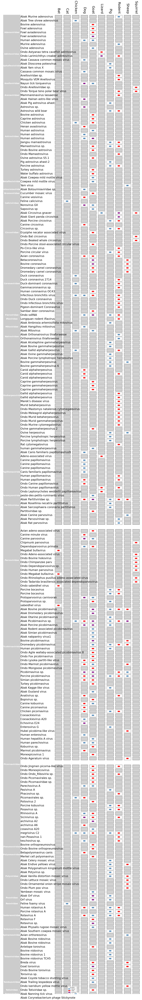

In [24]:
# -------------------------------------------------------------------
# 1. READ & PREPARE THE DATA
# -------------------------------------------------------------------
df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/Name_DNA_RNA_virus1.csv")

# Mark presence if read_count > 0
df['presence'] = df['read_count'].apply(lambda x: 1 if x > 0 else 0)

def unify_name(n):
    # unify certain virus names if desired
    if "Human adenovirus" in n:
        return "Human adenovirus"
    if "Betacoronavirus" in n:
        return "Betacoronavirus"
    if "Dromedary Camel coronavirus" in n:
        return "Dromedary Camel coronavirus"
    if "Porcine bosavirus" in n:
        return "Porcine bosavirus"
    return n

df['name'] = df['name'].apply(unify_name)

# Clean up location strings (remove extra spaces)
df['collected_by'] = df['collected_by'].str.strip()

# Build a dictionary that tracks which locations a virus-host pair came from
location_dict = {}  # (family, name, ska_species) -> set of locations
for _, row in df.iterrows():
    if row['presence'] == 1:
        key = (row['family'], unify_name(row['name']), row['ska_species'])
        location_dict.setdefault(key, set()).add(row['collected_by'])

# Aggregate presence by (name, family, ska_species)
df_agg = df.groupby(['name', 'family', 'ska_species'], as_index=False)['presence'].max()

# Pivot: rows=(family,name), cols=hosts
df_pivot = df_agg.pivot_table(
    index=['family', 'name'],
    columns='ska_species',
    values='presence',
    fill_value=0
).reset_index()

# Ensure unique virus names
df_pivot = df_pivot.drop_duplicates(subset=['name'])

# Debugging: Print unique virus names
print("Unique virus names in df_pivot:")
print(df_pivot['name'].unique())

# Optionally remove single-host viruses
host_cols = [c for c in df_pivot.columns if c not in ('family', 'name')]
df_pivot['host_count'] = df_pivot[host_cols].sum(axis=1)
df_pivot = df_pivot[df_pivot['host_count'] > 0]  # Changed from > 1 to > 0
df_pivot.drop(columns='host_count', inplace=True)

# Remove empty host columns
hosts_to_keep = [h for h in host_cols if df_pivot[h].sum() > 0]
df_pivot = df_pivot[['family', 'name'] + hosts_to_keep]

# Debugging: Print final pivot table
print("Final pivot table:")
print(df_pivot.head())

# -------------------------------------------------------------------
# 2. FAMILY->COLOR MAP (Optional)
# -------------------------------------------------------------------
try:
    color_df = pd.read_csv("/Volumes/aine_store/SENZOR_project/SPlited_SENSOR_porject/IDseq/Combined_SENZOR_results/Ecological_model/fig3_color_palette.txt", sep="\t", header=True, names=["key","color"])
    family_color_map = dict(zip(color_df["key"], color_df["color"]))
    default_color = "#CCCCCC"
except:
    family_color_map = {}
default_color = "#CCCCCC"

# -------------------------------------------------------------------
# 3. SETUP FIGURE
# -------------------------------------------------------------------
num_rows = len(df_pivot)
num_hosts = len(hosts_to_keep)
fig_width = 18
fig_height = max(4, 0.5 * num_rows)

fig, ax = plt.subplots(figsize=(fig_width, fig_height))
ax.set_xlim([0, num_hosts + 6])
ax.set_ylim([0, num_rows + 1])
ax.invert_yaxis()
ax.axis('off')

# -------------------------------------------------------------------
# 4. DRAW A VERTICAL COLORED BAR PER FAMILY
# -------------------------------------------------------------------
family_groups = df_pivot.groupby('family').groups
bar_left = 0.0
bar_width = 2.0

for fam, indices in family_groups.items():
    row_min = min(indices)
    row_max = max(indices)
    top = row_min + 0.5
    bottom = row_max + 1.5
    height = bottom - top
    
    color_for_fam = family_color_map.get(fam, default_color)
    rect = patches.Rectangle(
        (bar_left, top),
        bar_width,
        height,
        facecolor=color_for_fam,
        edgecolor='none'
    )
    ax.add_patch(rect)
    
    ax.text(
        bar_left + bar_width/2,
        (top + bottom)/2,
        fam,
        ha='center', va='center',
        fontsize=18, fontweight='bold',
        color='white'
    )

# -------------------------------------------------------------------
# 5. DRAW VIRUS NAMES & BOXES WITH LOCATION-COLORED DOTS
# -------------------------------------------------------------------
virus_name_x = 2
start_box_x = 6

for i, row in df_pivot.iterrows():
    y_center = i + 1
    fam = row['family']
    virus_name = row['name']
    
    ax.text(
        virus_name_x, y_center,
        virus_name,
        ha='left', va='center',
        fontsize=24
    )
    
    for j, host in enumerate(hosts_to_keep):
        presence = row[host]
        x_left = start_box_x + j
        box_size = 0.8
        y_bottom = y_center - box_size/2
        
        fill_color = 'white' if presence == 1 else 'lightgrey'
        rect = patches.Rectangle(
            (x_left, y_bottom),
            box_size, box_size,
            facecolor=fill_color,
            edgecolor='black',
            linewidth=1
        )
        ax.add_patch(rect)
        
        if presence == 1:
            # Look up location(s) for this (fam, virus_name, host)
            key = (fam, virus_name, host)
            locs = location_dict.get(key, set())
            
            # Decide dot color
            if "Ebonyi" in locs and "Ondo" in locs:
                circle_color = "purple"
            elif "Ebonyi" in locs:
                circle_color = "steelblue"
            elif "Ondo" in locs:
                circle_color = "red"
            else:
                circle_color = "dodgerblue"
            
            circle = patches.Circle(
                (x_left + box_size/2, y_center),
                radius=0.15,
                facecolor=circle_color,
                edgecolor='none'
            )
            ax.add_patch(circle)

# -------------------------------------------------------------------
# 6. ADD HOST HEADERS
# -------------------------------------------------------------------
header_y = 0.3
for j, host in enumerate(hosts_to_keep):
    x_center = start_box_x + j + box_size/2
    ax.text(
        x_center, header_y,
        host,
        ha='center', va='bottom',
        rotation=270, fontsize=30
    )

# -------------------------------------------------------------------
# 7. ADD LEGEND FOR LOCATIONS
# -------------------------------------------------------------------
import matplotlib.patches as mpatches

legend_elements = [
    mpatches.Patch(facecolor='steelblue', edgecolor='none', label='Ebonyi'),
    mpatches.Patch(facecolor='red', edgecolor='none', label='Ondo'),
    mpatches.Patch(facecolor='purple', edgecolor='none', label='Co-occur')
]
ax.legend(handles=legend_elements, loc='lower center', title='Location')

# -------------------------------------------------------------------
# 8. SAVE & SHOW
# -------------------------------------------------------------------
plt.title("", pad=20, fontsize=20)
plt.tight_layout()
#plt.savefig("./single_vertical_family_bar_plot.png", dpi=300)
plt.show()